# FITS Files: Basics and Key Concepts

## What Are FITS Files?

FITS (Flexible Image Transport System) files are the standard format for storing and exchanging astronomical data. Developed by NASA, FITS files are widely used in astronomy to store:

- Images (e.g., from telescopes)
- Spectra
- Tables of data
- Metadata (e.g., observational details, instrument settings)

FITS files consist of one or more **Header Data Units (HDUs)** that store data and metadata.

---

## Key Components of FITS Files

### **1. Header Data Unit (HDU)**
An HDU is the fundamental building block of a FITS file. Each HDU contains:
- **Header**: ASCII metadata in key-value pairs describing the data (e.g., dimensions, data type, observation time).
- **Data**: Binary data, often an image or a table.

The first HDU in a FITS file is called the **Primary HDU**, which may contain an image or be empty.
Subsequent HDUs are called **extensions** and can store additional images, tables, or other data structures.

### **2. Data**
The data section of an HDU contains the actual content, such as:
- Pixel values for images (2D arrays or higher-dimensional cubes).
- Rows and columns for tables.

---

## Accessing FITS Data in Python
When working with FITS files in Python (using `astropy.io.fits`), indexing and attributes play a critical role:

### **Indexing (0 and 1)**
- **Index 0**: Refers to the **Primary HDU**, the first HDU in the file.
  - Example: `hdu_list[0]`
- **Index 1**: Refers to the first extension HDU (if present).
  - Example: `hdu_list[1]`

### **HDU Object**
An HDU object has two key components:
1. **`header`**: Contains the metadata for the HDU.
   - Example: `hdu_list[0].header`
2. **`data`**: Contains the data array or table for the HDU.
   - Example: `hdu_list[0].data`

### **Examples**
```python
from astropy.io import fits

# Open a FITS file
hdu_list = fits.open('example.fits')

# Access Primary HDU
primary_hdu = hdu_list[0]

# Get metadata (header)
print(primary_hdu.header)

# Get image data
image_data = primary_hdu.data

# Access first extension HDU (if it exists)
extension_hdu = hdu_list[1]
```

---

## Summary of Terms

| Term        | Description                                                                 |
|-------------|-----------------------------------------------------------------------------|
| **FITS**    | File format for astronomical data, storing images, spectra, and tables.    |
| **HDU**     | Header Data Unit: Contains header (metadata) and data (content).           |
| **Header**  | ASCII key-value pairs describing the data and file properties.             |
| **Data**    | Binary content: image arrays, tables, or other data structures.            |
| **Index 0** | Refers to the Primary HDU in a FITS file.                                  |
| **Index 1** | Refers to the first extension HDU in a FITS file.                          |

---

FITS files are powerful and versatile, allowing astronomers to handle complex datasets efficiently. Understanding HDUs, headers, and data access is essential for working with FITS files effectively.



In [32]:
from astropy.io import fits

fits_file = fits.open('data/hlsp_hugs_hst_acs-wfc_ngc0104_f814w_v1_stack-0050s.fits')

image = fits_file[0].data
print(image)

[[-25. -25. -25. ... -25. -25. -25.]
 [-25. -25. -25. ... -25. -25. -25.]
 [-25. -25. -25. ... -25. -25. -25.]
 ...
 [-25. -25. -25. ... -25. -25. -25.]
 [-25. -25. -25. ... -25. -25. -25.]
 [-25. -25. -25. ... -25. -25. -25.]]


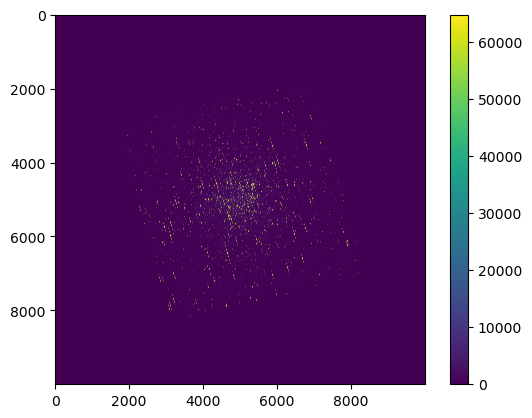

In [33]:
import matplotlib.pyplot as plt

plt.figure()
plt.imshow(image)
plt.colorbar()

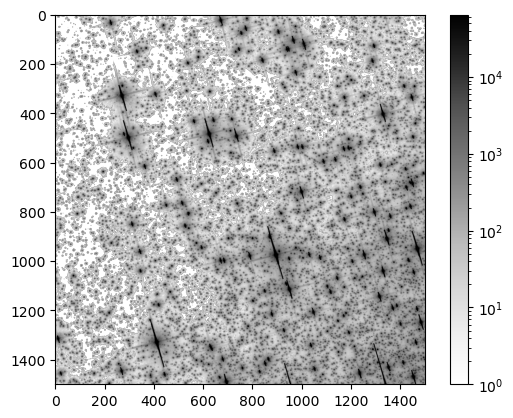

In [34]:
from matplotlib.colors import LogNorm

x_min, x_max = 3000, 4500
y_min, y_max = 3000, 4500

plt.figure()
plt.imshow(image[y_min:y_max,x_min:x_max],cmap='Greys',norm=LogNorm())
plt.colorbar()

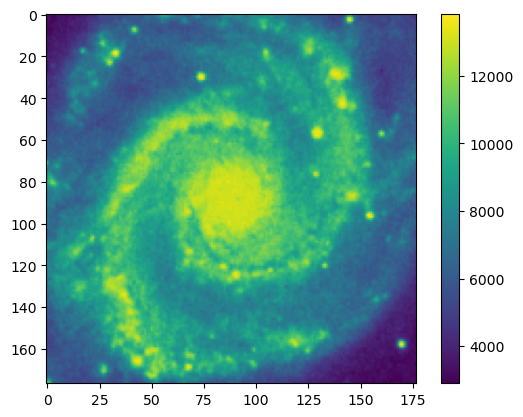

In [35]:
from astropy.io import fits

fits_file = fits.open('data/dss1.13.29.52.7+47.11.42.9.fits')

image = fits_file[0].data

plt.figure()
plt.imshow(image)
plt.colorbar()

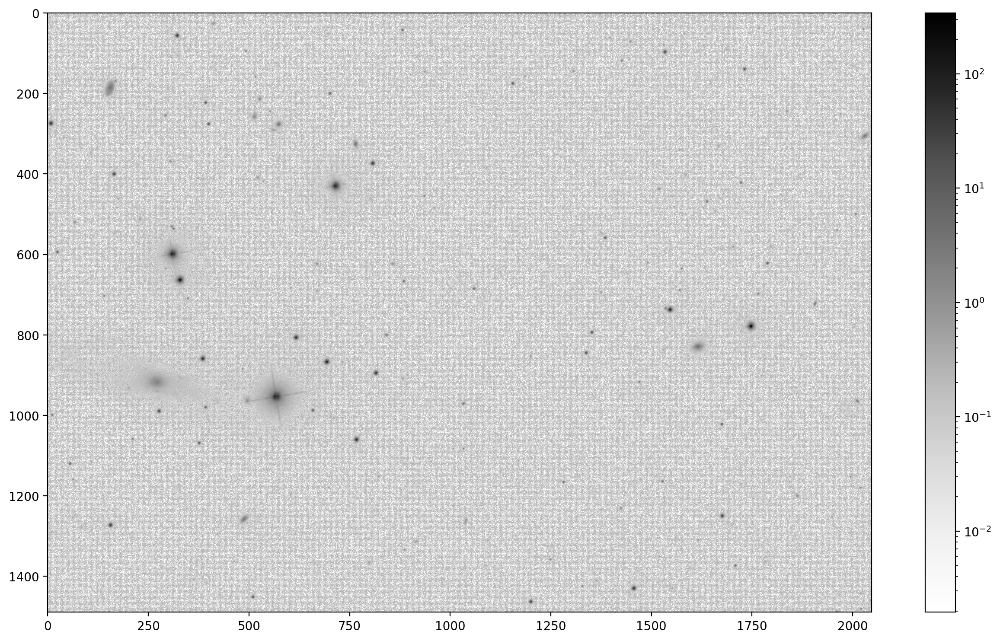

In [36]:
from astropy.io import fits
from matplotlib.colors import LogNorm

fits_file = fits.open('data/frame-i-001231-5-0053.fits')

image = fits_file[0].data

plt.figure(figsize=(16,9),dpi=200)
plt.imshow(image,cmap='Greys',norm=LogNorm())
plt.colorbar()

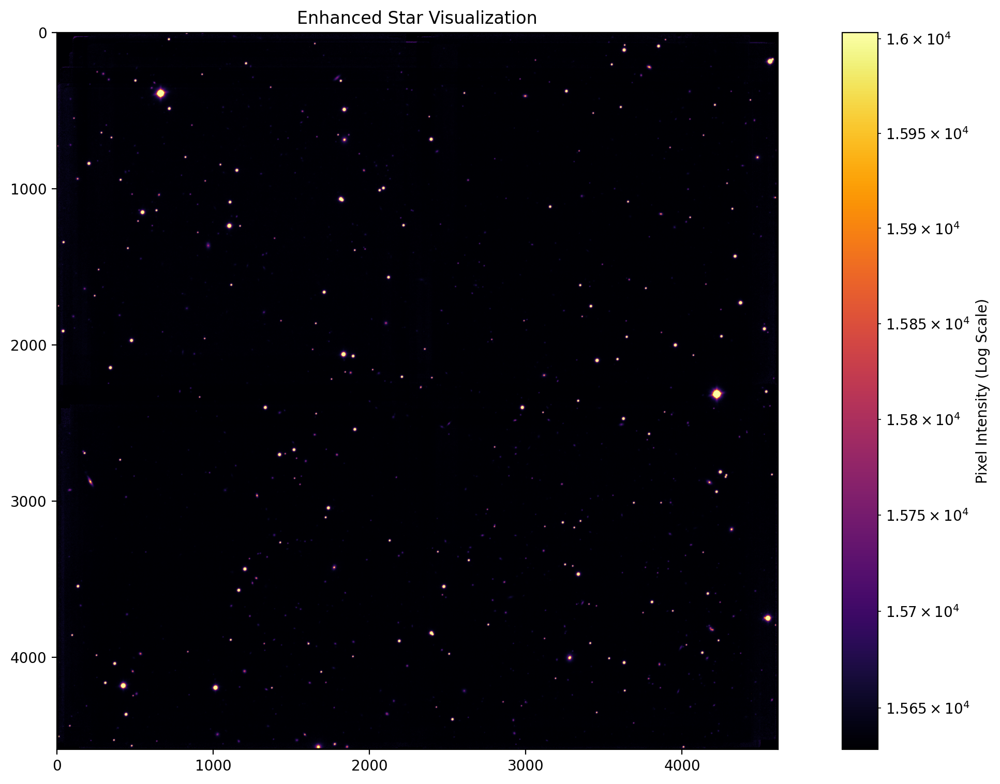

In [37]:
from astropy.io import fits
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import numpy as np

# Load the FITS file
fits_file = fits.open('data/ADP.2024-10-08T07_59_34.482.fits')
image = fits_file[0].data

# Exclude non-finite values
image = np.nan_to_num(image, nan=0.0)

# Set custom limits to enhance the stars' brightness
vmin = np.percentile(image, 50)  # Lower cutoff
vmax = np.percentile(image, 99.9)  # Upper cutoff

# Plot the image
plt.figure(figsize=(16, 9), dpi=200)
plt.imshow(image, cmap='inferno', norm=LogNorm(vmin=vmin, vmax=vmax))
plt.colorbar(label='Pixel Intensity (Log Scale)')
plt.title('Enhanced Star Visualization')
plt.show()


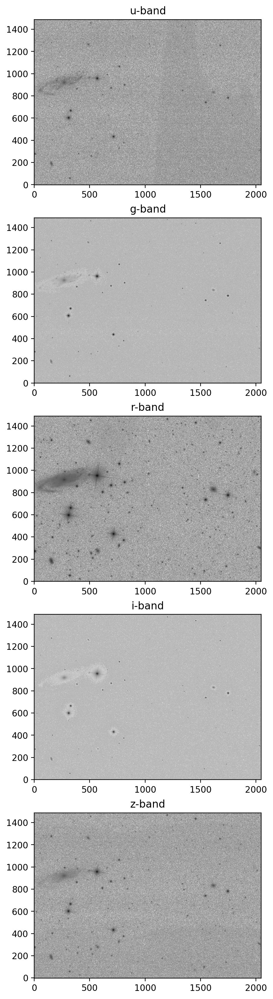

In [38]:
from astropy.io import fits
from matplotlib.colors import LogNorm

u = fits.open('data/frame-u-001231-5-0053.fits')
g = fits.open('data/frame-g-001231-5-0053.fits')
r = fits.open('data/frame-r-001231-5-0053.fits')
i = fits.open('data/frame-i-001231-5-0053.fits')
z = fits.open('data/frame-z-001231-5-0053.fits')

u_image = u[0].data
g_image = g[0].data
r_image = r[0].data
i_image = i[0].data
z_image = z[0].data


fig,ax = plt.subplots(5, 1, figsize=(7, 20), dpi=200)

ax[0].imshow(u_image,cmap='Greys',norm=LogNorm(),origin='lower')
ax[0].set_title('u-band')

ax[1].imshow(g_image,cmap='Greys',norm=LogNorm(),origin='lower')
ax[1].set_title('g-band')

ax[2].imshow(r_image,cmap='Greys',norm=LogNorm(),origin='lower')
ax[2].set_title('r-band')

ax[3].imshow(i_image,cmap='Greys',norm=LogNorm(),origin='lower')
ax[3].set_title('i-band')

ax[4].imshow(z_image,cmap='Greys',norm=LogNorm(),origin='lower')
ax[4].set_title('z-band')

plt.show()

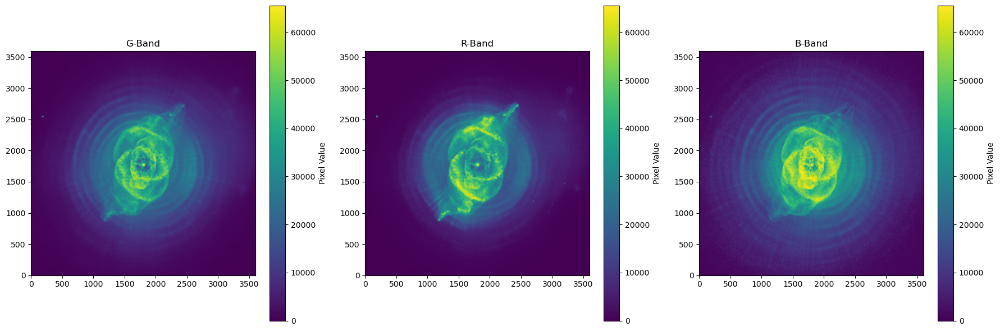

In [39]:
import matplotlib.pyplot as plt
from astropy.io import fits
from matplotlib.colors import LogNorm

# File paths for the three bands
g_file = 'data/ngc6543_optical_G.fits'
r_file = 'data/ngc6543_optical_R.fits'
b_file = 'data/ngc6543_optical_B.fits'

# Open FITS files and load data
g_data = fits.open(g_file)[0].data
r_data = fits.open(r_file)[0].data
b_data = fits.open(b_file)[0].data

# Create a figure with subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Plot each band in a subplot
bands = {'G': g_data, 'R': r_data, 'B': b_data}
for ax, (label, data) in zip(axes, bands.items()):
    im = ax.imshow(data,origin='lower')
    ax.set_title(f"{label}-Band")
    plt.colorbar(im, ax=ax, orientation='vertical', label="Pixel Value")

# Adjust layout
plt.tight_layout()
plt.show()

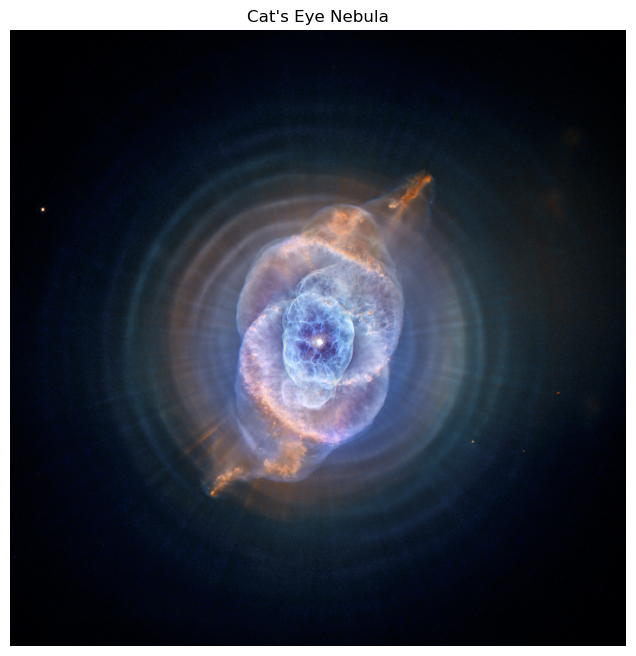

In [40]:
# Import necessary libraries
from astropy.io import fits  # For handling FITS files, a common format for astronomical data
import numpy as np  # For numerical operations
import matplotlib.pyplot as plt  # For plotting images

# Paths to FITS files for the different optical filters (G, R, B)
g_file = "data/ngc6543_optical_G.fits"  # Green filter data file
r_file = "data/ngc6543_optical_R.fits"  # Red filter data file
i_file = "data/ngc6543_optical_B.fits"  # Blue filter data file (or replace with 'z_filter.fits' for blue)

# Open and read the data from the FITS files using Astropy
# Each filter file is opened and the data is extracted
with fits.open(g_file) as g_hdul, fits.open(r_file) as r_hdul, fits.open(i_file) as i_hdul:
    g_data = g_hdul[0].data  # Green filter data (2D array of pixel values)
    r_data = r_hdul[0].data  # Red filter data
    i_data = i_hdul[0].data  # Blue filter data (or the alternative z_filter data)

# Define a function to normalize the data
def normalize(data, scale_min=0, scale_max=1):
    """Normalize data to a range between scale_min and scale_max."""
    # Find the minimum and maximum values in the data
    data_min = np.min(data)  # Minimum value in the data
    data_max = np.max(data)  # Maximum value in the data
    # Scale the data so that it fits between scale_min and scale_max
    return (data - data_min) / (data_max - data_min) * (scale_max - scale_min) + scale_min

# Normalize the data for each color filter (green, red, blue)
r_norm = normalize(r_data)  # Normalize red filter data
g_norm = normalize(g_data)  # Normalize green filter data
i_norm = normalize(i_data)  # Normalize blue filter data (or use z_norm if using z_filter)

# Create an empty image array to store the RGB image
# The image has the same height and width as the original filter data but with 3 color channels (RGB)
rgb_image = np.zeros((r_norm.shape[0], r_norm.shape[1], 3))  # 3 channels for RGB
# Try printing the empty image array and see how it works. Check its shape and dimensions - print(rgb_image)

# Assign the normalized filter data to the corresponding color channels in the RGB image
rgb_image[:, :, 0] = r_norm  # Red channel (using the normalized red data)
rgb_image[:, :, 1] = g_norm  # Green channel (using the normalized green data)
rgb_image[:, :, 2] = i_norm  # Blue channel (using the normalized blue data)

# Plot the RGB image using matplotlib
plt.figure(figsize=(8, 8))  # Set the size of the plot
plt.imshow(rgb_image,origin='lower', interpolation='nearest')  # Display the image (nearest interpolation for faster rendering)
plt.title("Cat's Eye Nebula")  # Set the title of the image
plt.axis("off")  # Turn off the axis labels (for a cleaner image)
plt.show()  # Show the image

# RGB images using the Lupton et al (2004) scheme

https://docs.astropy.org/en/stable/visualization/rgb.html#rgb-images-using-the-lupton-et-al-2004-scheme

Lupton et al. (2004) describe an “optimal” algorithm for producing red-green- blue composite images from three separate high-dynamic range arrays. This method is implemented in make_lupton_rgb() as a convenience wrapper function and an associated set of classes to provide alternate scalings.


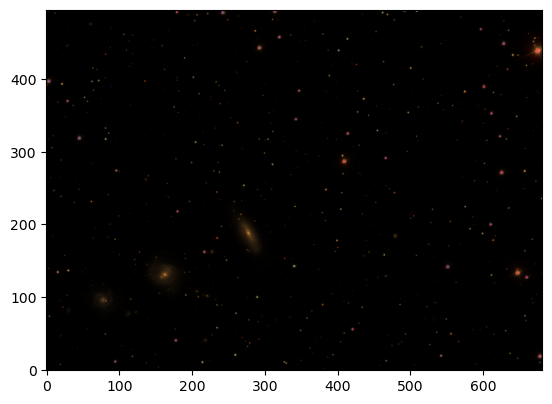

In [41]:
import matplotlib.pyplot as plt
from astropy.visualization import make_lupton_rgb
from astropy.io import fits
from astropy.utils.data import get_pkg_data_filename

# Read in the three images downloaded from here:
g_name = get_pkg_data_filename('visualization/reprojected_sdss_g.fits.bz2')
r_name = get_pkg_data_filename('visualization/reprojected_sdss_r.fits.bz2')
i_name = get_pkg_data_filename('visualization/reprojected_sdss_i.fits.bz2')
g = fits.getdata(g_name)
r = fits.getdata(r_name)
i = fits.getdata(i_name)

rgb_default = make_lupton_rgb(i, r, g, filename="ngc6976-default.jpeg")

plt.imshow(rgb_default, origin='lower')

`make_lupton_rgb(i,r,g)` this function takes three 2D arrays of image data and combines them into one single RGB image. It applies a specific transformation as given by Lupton's algorithm to the data to enhance the contrast, making the final image more visually appealing. It enhances the visibility of faint objects in astronomical images while reducing the dominance of brighter regions.

The keyword `origin=lower` in plt.imshow function controls the orientation of the image. In many astronomical images the origin (0,0) is at the top left, so it is useful to flip the image so that origin is in the bottom left as it's typically what we are used to. 

Furthermore, we can use `LogStretch` and `ManualInterval` classes from Astropy to create a logarithmic stretch RGB image of the three filters. This enhances the details in regions with low signal intensity. See image output of the code below.

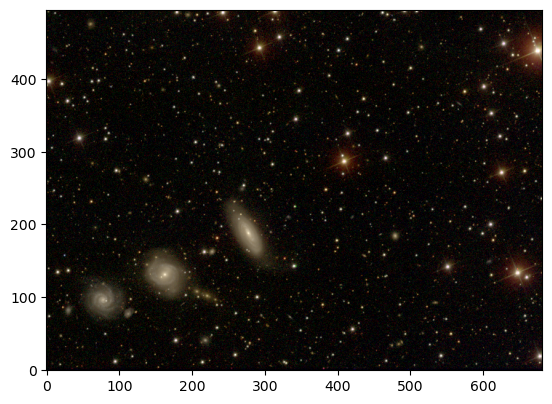

In [42]:
from astropy.visualization import LogStretch
from astropy.visualization import make_rgb, ManualInterval

# Use the maximum value of the 99.95% percentile over all three filters
# as the maximum value:
pctl = 99.95
maximum = 0.
for img in [i,r,g]:
    val = np.percentile(img,pctl)
    if val > maximum:
        maximum = val

rgb_log = make_rgb(i, r, g, interval=ManualInterval(vmin=0, vmax=maximum),
                   stretch=LogStretch(a=1000), filename="ngc6976-log.jpeg")
plt.imshow(rgb_log, origin='lower')

# References

## FITS Data Sources

- SDSS DR18 Homepage - https://dr18.sdss.org/
- SDSS Skyserver Navigation tool to fetch objects and download fits - https://skyserver.sdss.org/dr18/VisualTools/navi
- FITS data source for Chandra - https://chandra.harvard.edu/photo/openFITS/multiwavelength_data.html
- HUGS (Hubble UV Globular Cluster Survey) - https://archive.stsci.edu/prepds/hugs/
- ESO Archive - https://archive.eso.org/scienceportal/home
- FITS image used for demo in this notebook - https://archive.eso.org/dataset/ADP.2024-10-08T07:59:34.482

## Docs
- Lupton et al 2004 RGB Scheme - https://docs.astropy.org/en/stable/visualization/rgb.html#rgb-images-using-the-lupton-et-al-2004-scheme
- List of catalogs used in SkyCoord.from_name method - https://cds.unistra.fr/cgi-bin/Sesame
- Astropy Physical Types - https://docs.astropy.org/en/stable/units/physical_types.html#physical-types
- NASA FITS Standard - https://fits.gsfc.nasa.gov/fits_standard.html
- Astropy Workshop docs - https://github.com/astropy/astropy-workshop/blob/main/05-FITS/io_fits_ascii_overview.ipynb
- Astropy Coordinates - https://docs.astropy.org/en/stable/coordinates/index.html
- Astropy Cosmology Units - https://docs.astropy.org/en/stable/cosmology/units.html#module-astropy.cosmology.units
- Astropy known issues with using units with Numpy or Pandas - https://docs.astropy.org/en/stable/known_issues.html#quantities-lose-their-units-with-some-operations
- Astroquery to query Catelogs - https://astroquery.readthedocs.io/en/latest/ipac/irsa/irsa.html
- Astropy Equivalencies - https://docs.astropy.org/en/stable/units/equivalencies.html